In [1]:
import warnings
warnings.filterwarnings('ignore')
import visualize_units_saliency_maps_module
import visualize_units_reg_opt_module
import matplotlib.pyplot as plt
import numpy as np
from scipy.misc import imread
from scipy.misc import imresize
from scipy.misc import imsave

# Visualizing Most Frequently Activated Hidden Units in Fc7 Layer of AlexNet

A hidden unit has been visualized using:
* Synthetic images, generated via regularized optimization, that cause high activation in the given unit [1]. 
* top-9 images in COCO that cause the highest activation for the given unit.
* Saliency maps for each of those top-9 images [2].

The above results for most frequently activated hidden units can be seen below.
   
[1] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop.   
[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps", ICLR Workshop 2014.

In [2]:
# load fc7 activations for all 118k COCO images and list of COCO image file names
coco_activations = np.load('../alexnet_imagenet_distribution/data/coco_output.npy')
image_list = np.load('../alexnet_imagenet_distribution/data/image_list_coco.npy')
most_activated_features = [2018, 174, 840, 1629, 3254, 1201, 1855,  996, 1602, 1358] #features highly activated by COCO images

Instructions for updating:
Use `tf.global_variables_initializer` instead.


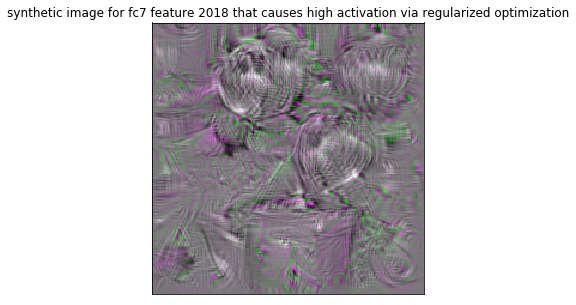

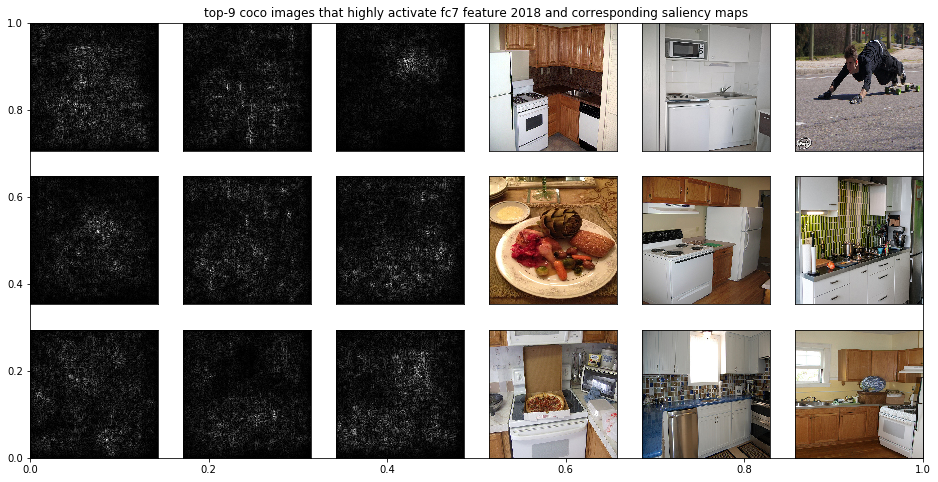

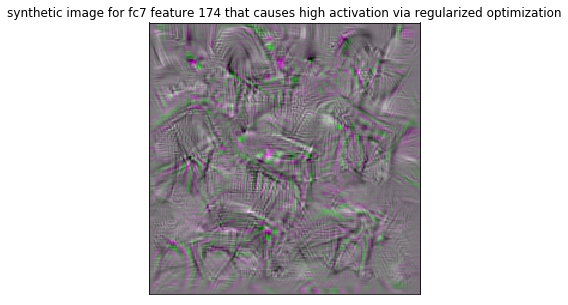

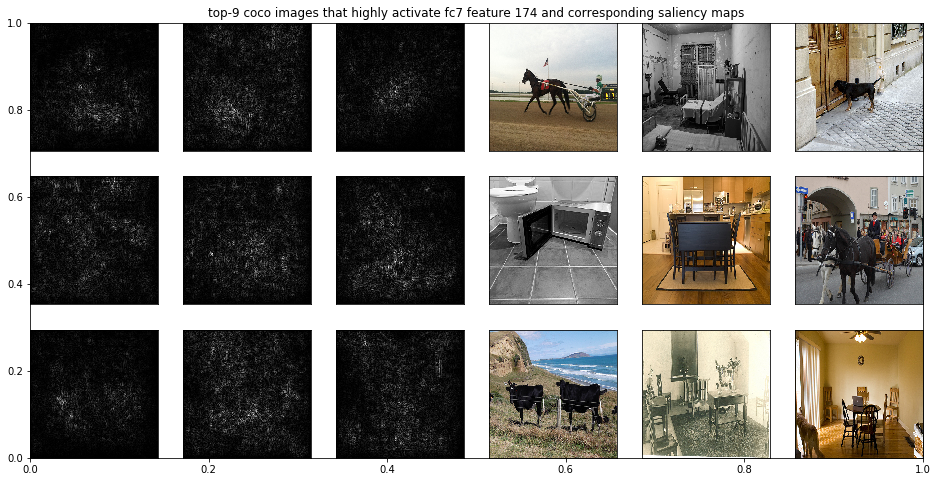

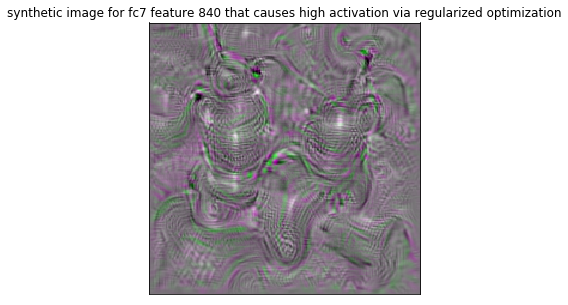

...

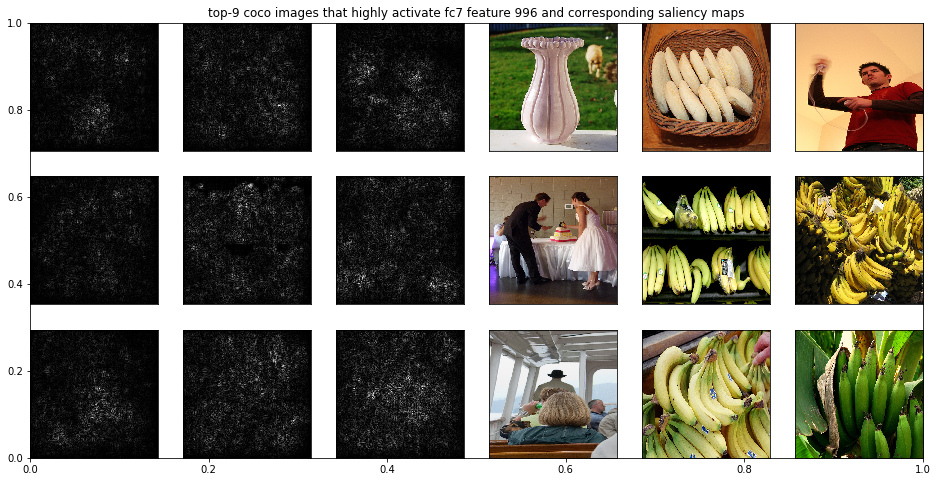

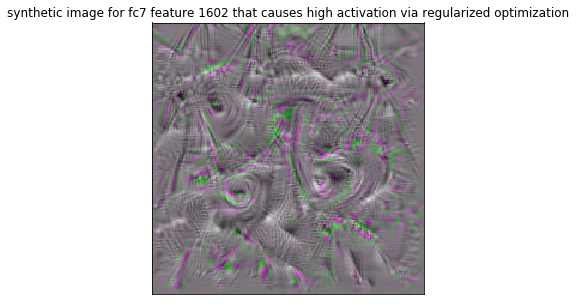

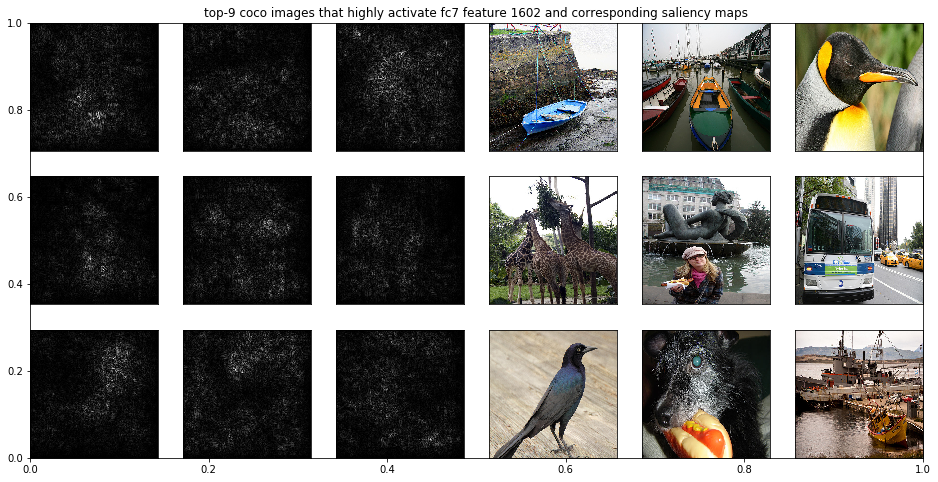

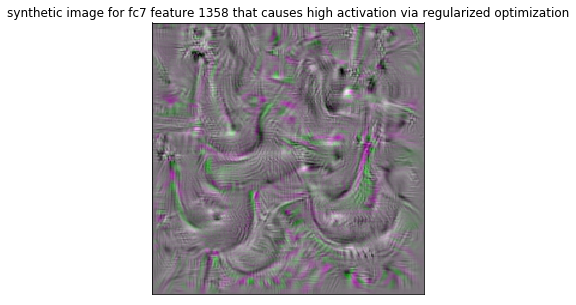

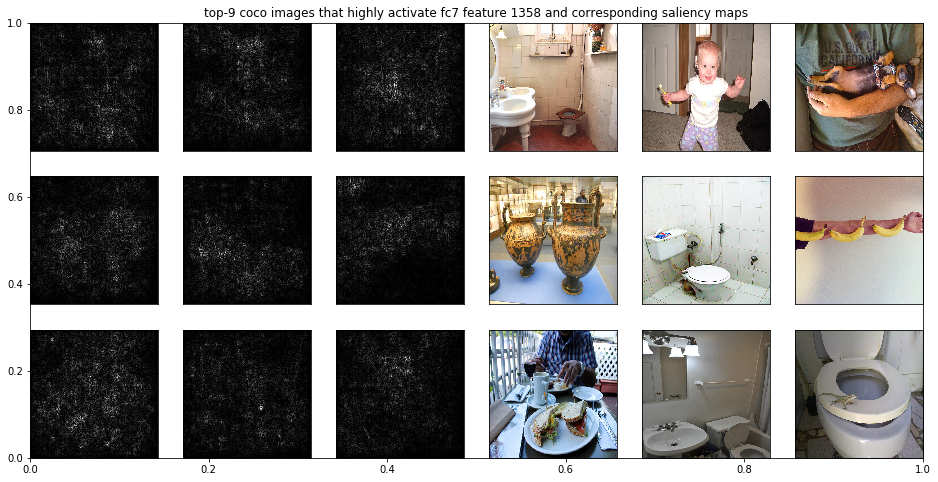

In [3]:
for index in most_activated_features: 
    # sort the activations for feature 'index' and get images that correspond to top 9 activations
    feature_activations = coco_activations[:,index]
    sorted_feature_activation_indices = np.argsort(feature_activations)
    sorted_feature_activation_indices = np.flipud(sorted_feature_activation_indices)
    
    top_9_images = image_list[sorted_feature_activation_indices[0:9]]
    
    fig = plt.figure(figsize=(5,5))
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.title('synthetic image for fc7 feature '+str(index)+' that causes high activation via regularized optimization')
    opt_img = visualize_units_reg_opt_module.get_optimal_image(index)
    plt.imshow(opt_img)
    fig = plt.figure(figsize=(16,8))
    plt.title('top-9 coco images that highly activate fc7 feature '+str(index)+' and corresponding saliency maps')
    
    for i,j in [(1,0), (2,1), (3,2), (7,3), (8,4), (9,5), (13,6), (14,7), (15,8)]:
        ax = fig.add_subplot(3, 6, i)
        saliency_map = visualize_units_saliency_maps_module.get_saliency_map('../data/train2017/'+ top_9_images[j],index)
        ax.imshow(saliency_map, aspect="auto", cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    for i,j in [(4,0), (5,1), (6,2), (10,3), (11,4), (12,5), (16,6), (17,7), (18,8)]:
        img = imread('../data/train2017/'+top_9_images[j])
        ax = fig.add_subplot(3, 6, i)
        ax.imshow(img, aspect="auto")
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


# Future Work
* Perform hyperparameter optimization to produce better synthetic images
* Visualize units in other layers.